In [23]:
# Install a pip package in the current Jupyter kernel
import sys
#!{sys.executable} -m pip install mne-connectivity

In [2]:
import warnings
warnings.filterwarnings("ignore")

In [27]:
import os
import gc
from glob import glob
import numpy as np
import scipy as sp
import sklearn
import statistics, math
import random as rd
import pandas as pd
import dataframe_image as dfi
pd.options.display.float_format = '{:,.2f}'.format

from math import sqrt, ceil

from sklearn import metrics, svm
from sklearn import decomposition, cluster
from sklearn.cluster import KMeans, AgglomerativeClustering, DBSCAN, OPTICS
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import (classification_report, confusion_matrix, ConfusionMatrixDisplay, accuracy_score, f1_score, 
                             roc_auc_score, balanced_accuracy_score, precision_score, recall_score, RocCurveDisplay)
from sklearn.model_selection import train_test_split, TimeSeriesSplit, GridSearchCV, cross_val_score
from sklearn.linear_model import LinearRegression, LogisticRegression, LogisticRegressionCV
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.pipeline import Pipeline
from xgboost import XGBClassifier

from scipy.spatial.distance import correlation
from IPython.display import display

In [28]:
print(sklearn.__file__)
print(sklearn.__version__)

C:\Users\Lenovo\anaconda3\lib\site-packages\sklearn\__init__.py
1.1.2


In [4]:
import mne
#import mne_connectivity

from mne.preprocessing import (ICA, create_eog_epochs, create_ecg_epochs, corrmap, annotate_muscle_zscore, peak_finder,
                               find_eog_events, find_ecg_events, ica_find_ecg_events, find_bad_channels_maxwell)
from mne.time_frequency import (tfr_array_multitaper, psd_array_multitaper, csd_array_multitaper, csd_array_morlet)

from mne_connectivity import seed_target_indices, spectral_connectivity_epochs, spectral_connectivity_time

print(mne.__file__)
print(mne.__version__)

C:\Users\Lenovo\anaconda3\lib\site-packages\mne\__init__.py
1.3.1


In [5]:
import plotly.graph_objects as go
from gtda.time_series import SingleTakensEmbedding, TakensEmbedding, takens_embedding_optimal_parameters
from gtda.homology import VietorisRipsPersistence
from gtda.diagrams import BettiCurve, Scaler, Filtering, Amplitude, PersistenceEntropy, NumberOfPoints
from gtda.plotting import plot_point_cloud


In [6]:
# Configure the graphics engine

import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle

plt.rc('figure', max_open_warning=200)
%matplotlib notebook
#%matplotlib inline
#%matplotlib qt

In [7]:
import seaborn as sns
# Apply the default theme
sns.set_theme()

In [8]:
# My modules
import my_varexplore as ve
import my_dimreduct as dr
import my_clustquality as cq
import my_stageprocess as spr

# Global variables

In [9]:
#==============================================
# Input main data information
#==============================================

# Number of the subject for analysis
SUBJ_NUM = 10

# For m1 and m3 suffix for EEG record number 
SUFFIX = '' # for m10 & m8
#SUFFIX = '_2' # for m3


In [10]:
# Initialize path variables for main folders

print(os.getcwd())

if (SUBJ_NUM < 10):
    subj_dir_name = 'm0' + str(SUBJ_NUM) + SUFFIX
else:
    subj_dir_name = 'm' + str(SUBJ_NUM) + SUFFIX

# Add suffix _surr for surrogate data to destination folder
subj_dir_name_surr = subj_dir_name + '_surr'
    
# Path for loading epoch data and features
ft_dir_path = os.path.join(os.getcwd(), 'features', subj_dir_name)
#ft_dir_path_surr = os.path.join(os.getcwd(), 'features', subj_dir_name_surr)

print(ft_dir_path)
#print(ft_dir_path_surr)

C:\Users\Lenovo\PycharmProjects\Tibet
C:\Users\Lenovo\PycharmProjects\Tibet\features\m10


In [11]:
# Frequency bands

bands = [(0.9, 4, 'Delta (0.9-4 Hz)', 'D'), (4, 8, 'Theta (4-8 Hz)', 'T'), (8, 14, 'Alpha (8-14 Hz)', 'A'), 
         (14, 25, 'Beta (14-25 Hz)', 'B'), (25, 40, 'Gamma (25-40 Hz)', 'G')]

bands_test = [(0.9, 4, 'Delta (0.9-4 Hz)', 'D'), (4, 7, 'Theta (4-7 Hz)', 'T'), (7, 10, 'Alpha1 (7-10 Hz)','A1'), 
         (10, 13, 'Alpha2 (10-13 Hz)', 'A2'), (13, 20, 'Beta1 (13-20 Hz)', 'B1'), (20, 30, 'Beta2 (20-30 Hz)', 'B2'), 
         (30, 45, 'Gamma (30-45 Hz)', 'G')]

str_freq = [bands[i][3] for i in range(len(bands))]
#str_freq_rr = ['r'+_str for _str in str_freq]
str_freq_rr = str_freq
n_freq = len(str_freq_rr)


In [12]:
# Localization by scalp regions

regions = [(['Fp1','Fp2','Fpz'], 'Fp', 'Pre-frontal'), (['F7','F3','FT7','FC3'], 'LF', 'Left Frontal'), 
           (['Fz','FCz'], 'MF', 'Midline Frontal'), (['F4','F8','FC4','FT8'], 'RF', 'Right Frontal'),
           (['T3','TP7','T5'], 'LT', 'Left Temporal'), (['T4','TP8','T6'], 'RT', 'Right Temporal'), 
           (['C3','CP3'], 'LC', 'Left Central'), (['Cz','CPz'], 'MC', 'Midline Central'), (['C4','CP4'], 'RC', 'Right Central'),
           (['P3','P5'], 'LP', 'Left Parietal'), (['Pz'], 'MP', 'Midline Parietal'), (['P4','P6'], 'RP', 'Right Parietal'), 
           (['PO3','PO7','O1'], 'LO', 'Left Occipital'), (['POz','Oz'], 'MO', 'Midline Occipital'), 
           (['PO4','PO8','O2'], 'RO', 'Right Occipital')]
regions_plt = [(['Fp1','Fp2','Fpz'], 'Fp', 'Pre-frontal', ['Fp']), (['F7','F3','FT7','FC3'], 'LF', 'Left Frontal', ['LF']), 
               (['Fz','FCz'], 'MF', 'Midline Frontal', ['MF']), (['F4','F8','FC4','FT8'], 'RF', 'Right Frontal', ['RF']),
               (['T3','TP7','T5'], 'LT', 'Left Temporal', ['LT']), (['T4','TP8','T6'], 'RT', 'Right Temporal', ['RT']), 
               (['C3','CP3','Cz','CPz','C4','CP4'], 'Cen', 'Central', ['LC','MC','RC']), 
               (['P3','P5','Pz','P4','P6'], 'Par', 'Parietal', ['LP','MP','RP']), 
               (['PO3','PO7','O1','POz','Oz','PO4','PO8','O2'], 'Occ', 'Occipital', ['LO','MO','RO'])]

n_regions = len(regions)
n_regions_plt = len(regions_plt)



# Loading data

In [13]:
# Loading epochs (Meditator data)

epochs_filt_rr = mne.read_epochs(os.path.join(ft_dir_path, 'epochs_filt_rr-epo.fif'))
#epochs_filt_rr = epochs_filt_rr[:-2] # for m8 (artifacts at the end)
print(epochs_filt_rr.get_data().shape)

sampling_rate = epochs_filt_rr.info['sfreq']
n_samples = epochs_filt_rr.__len__()
n_times = len(epochs_filt_rr.get_data()[0,0,:])
print(n_samples, n_times)

ch_names = epochs_filt_rr.ch_names
n_channels = len(ch_names)
print(ch_names)

Reading C:\Users\Lenovo\PycharmProjects\Tibet\features\m10\epochs_filt_rr-epo.fif ...
    Found the data of interest:
        t =    -500.00 ...     500.00 ms
        0 CTF compensation matrices available
Not setting metadata
1046 matching events found
No baseline correction applied
0 projection items activated
(1046, 40, 501)
1046 501
['Fp1', 'Fpz', 'Fp2', 'F7', 'F3', 'Fz', 'F4', 'F8', 'FT7', 'FC3', 'FCz', 'FC4', 'FT8', 'T3', 'C3', 'Cz', 'C4', 'T4', 'TP7', 'CP3', 'CPz', 'CP4', 'TP8', 'A1', 'T5', 'P3', 'Pz', 'P4', 'T6', 'A2', 'P5', 'PO3', 'POz', 'PO4', 'P6', 'PO7', 'O1', 'Oz', 'O2', 'PO8']


In [14]:
# Loading main features DataFrames

df_ft_psd_loc_db = pd.read_feather(os.path.join(ft_dir_path, 'df_ft_psd_loc_db.feather'))[:n_samples]
df_ft_psd_plt_db = pd.read_feather(os.path.join(ft_dir_path, 'df_ft_psd_plt_db.feather'))[:n_samples]
df_ft_psd_all_db = pd.read_feather(os.path.join(ft_dir_path, 'df_ft_psd_all_db.feather'))[:n_samples]
df_ft_psd_ind_loc_log = pd.read_feather(os.path.join(ft_dir_path, 'df_ft_psd_ind_loc_log.feather'))[:n_samples]
df_ft_psd_ind_plt_log = pd.read_feather(os.path.join(ft_dir_path, 'df_ft_psd_ind_plt_log.feather'))[:n_samples]
df_ft_psd_ind_all_log = pd.read_feather(os.path.join(ft_dir_path, 'df_ft_psd_ind_all_log.feather'))[:n_samples]

#df_ft_coh = pd.read_feather(os.path.join(ft_dir_path, 'df_ft_coh.feather'))
#df_ft_plv = pd.read_feather(os.path.join(ft_dir_path, 'df_ft_plv.feather'))
df_ft_coh_loc = pd.read_feather(os.path.join(ft_dir_path, 'df_ft_coh_loc.feather'))[:n_samples]
df_ft_plv_loc = pd.read_feather(os.path.join(ft_dir_path, 'df_ft_plv_loc.feather'))[:n_samples]
df_ft_coh_plt = pd.read_feather(os.path.join(ft_dir_path, 'df_ft_coh_plt.feather'))[:n_samples]
df_ft_plv_plt = pd.read_feather(os.path.join(ft_dir_path, 'df_ft_plv_plt.feather'))[:n_samples]

df_ft_coh_ind_loc = pd.read_feather(os.path.join(ft_dir_path, 'df_ft_coh_ind_loc.feather'))[:n_samples]
df_ft_plv_ind_loc = pd.read_feather(os.path.join(ft_dir_path, 'df_ft_plv_ind_loc.feather'))[:n_samples]
df_ft_coh_ind_plt = pd.read_feather(os.path.join(ft_dir_path, 'df_ft_coh_ind_plt.feather'))[:n_samples]
df_ft_plv_ind_plt = pd.read_feather(os.path.join(ft_dir_path, 'df_ft_plv_ind_plt.feather'))[:n_samples]
df_ft_coh_ind_all = pd.read_feather(os.path.join(ft_dir_path, 'df_ft_coh_ind_all.feather'))[:n_samples]
df_ft_plv_ind_all = pd.read_feather(os.path.join(ft_dir_path, 'df_ft_plv_ind_all.feather'))[:n_samples]

In [15]:
# Scaling features data

# PSD & PSD indices
ft_psd_loc_db_sc = StandardScaler().fit_transform(df_ft_psd_loc_db.to_numpy())
df_ft_psd_loc_db_sc = pd.DataFrame(ft_psd_loc_db_sc, columns=df_ft_psd_loc_db.columns)
ft_psd_all_db_sc = StandardScaler().fit_transform(df_ft_psd_all_db.to_numpy())
df_ft_psd_all_db_sc = pd.DataFrame(ft_psd_all_db_sc, columns=df_ft_psd_all_db.columns)

ft_psd_ind_loc_sc = StandardScaler().fit_transform(df_ft_psd_ind_loc_log.to_numpy())
df_ft_psd_ind_loc_sc = pd.DataFrame(ft_psd_ind_loc_sc, columns=df_ft_psd_ind_loc_log.columns)
ft_psd_ind_all_sc = StandardScaler().fit_transform(df_ft_psd_ind_all_log.to_numpy())
df_ft_psd_ind_all_sc = pd.DataFrame(ft_psd_ind_all_sc, columns=df_ft_psd_ind_all_log.columns)

# Coherence indices
ft_coh_ind_loc_sc = StandardScaler().fit_transform(df_ft_coh_ind_loc.to_numpy())
df_ft_coh_ind_loc_sc = pd.DataFrame(ft_coh_ind_loc_sc, columns=df_ft_coh_ind_loc.columns)

# PLV indices
ft_plv_ind_loc_sc = StandardScaler().fit_transform(df_ft_plv_ind_loc.to_numpy())
df_ft_plv_ind_loc_sc = pd.DataFrame(ft_plv_ind_loc_sc, columns=df_ft_plv_ind_loc.columns)


In [16]:
# Adding stage boundaries (Main data)

# Loading stage boundaries
st_edges_result = np.loadtxt(os.path.join(ft_dir_path, 'st_edges_result.txt'), dtype=int)
print(list(st_edges_result))

# Form stage bands and labels
st_bands, st_labels = spr.form_stage_bands(st_edges_result)
n_stages = len(st_bands)

# Stage names
st_names = [nm for (_, _, nm) in st_bands]
print(st_bands)
print(st_names)

[0, 92, 282, 492, 560, 682, 784, 857, 976, 1046]
[(0, 91, 'St1'), (92, 281, 'St2'), (282, 491, 'St3'), (492, 559, 'St4'), (560, 681, 'St5'), (682, 783, 'St6'), (784, 856, 'St7'), (857, 975, 'St8'), (976, 1045, 'St9')]
['St1', 'St2', 'St3', 'St4', 'St5', 'St6', 'St7', 'St8', 'St9']


# Stage analysis

## Features in stages

<IPython.core.display.Javascript object>


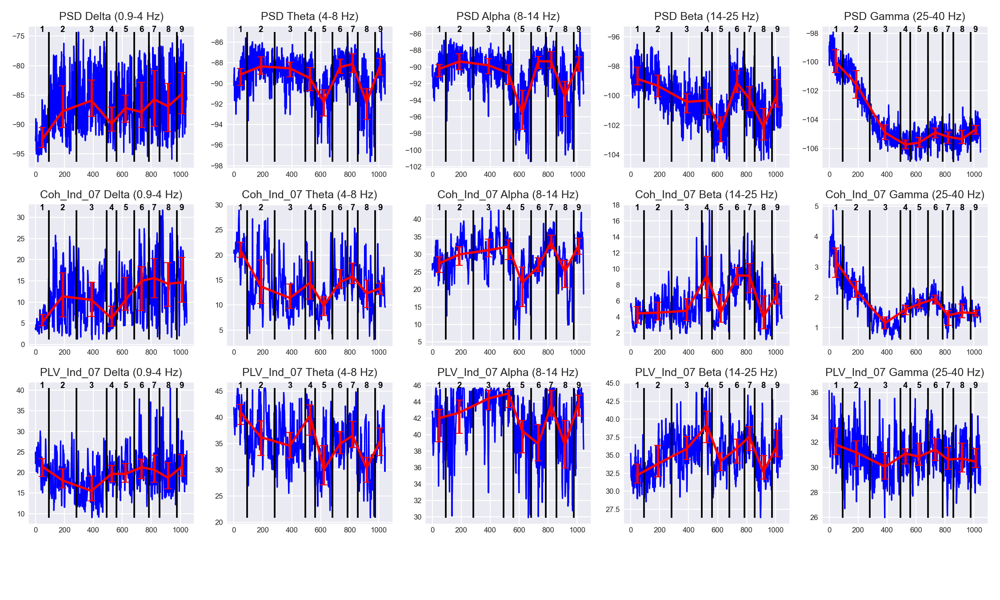

In [21]:
# Plotting overall PSD, Coherence and PLV with stage bounds

ind_rate = '07'

st_bands, st_labels = spr.form_stage_bands(st_edges_result)
x_st = [(smin + smax)/2 for (smin, smax, _) in st_bands]
#st_names = [st_nm for (_, _, st_nm) in st_bands]

# Features DataFrames
df_ft_psd = df_ft_psd_all_db
df_cols = [col for col in df_ft_coh_ind_all.columns if (ind_rate in col)]
df_ft_coh = df_ft_coh_ind_all[df_cols]
df_cols = [col for col in df_ft_plv_ind_all.columns if (ind_rate in col)]
df_ft_plv = df_ft_plv_ind_all[df_cols]

# Initialize plots
n_cols = n_freq
n_rows = 3
fig, axs = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(3*n_cols, 3*n_rows))
plt.subplots_adjust(left=0.02)

# PSD plots (1st row)
df_ft_clust = [df_ft_psd.iloc[smin:(smax+1), :] for (smin, smax, _) in st_bands]
df_ft_clust_stats = [df_ft_clust[_cl].describe() for _cl in range(n_stages)]
for i in range(n_freq):
    y = df_ft_psd.to_numpy()[:,i]  
    axs[0,i].plot(y, color='blue')
    axs[0,i].vlines(x=st_edges_result[1:-1], ymin=np.min(y), ymax=np.max(y), color='black', linewidth=1.8)
    axs[0,i].set_title("PSD "+ bands[i][2])
    axs[0,i].tick_params(axis='both', labelsize=8, direction='in')
    
    # Error bars (statistic plots)
    y_st = [df_ft_clust_stats[_cl].loc['50%'][i] for _cl in range(n_stages)]
    yerr = np.array([df_ft_clust_stats[_cl].loc[['25%','75%']].to_numpy() for _cl in range(n_stages)])[:,:,i].transpose(1,0)
    yerr[0,:] = y_st - yerr[0,:]
    yerr[1,:] = yerr[1,:] - y_st
    axs[0,i].errorbar(x_st, y_st, yerr, capsize=4, linewidth=2.5, color='red')
    
    # Add text (stage index)
    for _st in range(n_stages):
        axs[0,i].text(x_st[_st], np.max(y), _st+1, fontsize=9, color='black', horizontalalignment='center', fontweight='bold')
    
# Coherence plots (2nd row)
df_ft_clust = [df_ft_coh.iloc[smin:(smax+1), :] for (smin, smax, _) in st_bands]
df_ft_clust_stats = [df_ft_clust[_cl].describe() for _cl in range(n_stages)]
for i in range(n_freq):
    y = df_ft_coh.to_numpy()[:,i]
    axs[1,i].plot(y, color='blue')
    axs[1,i].vlines(x=st_edges_result[1:-1], ymin=np.min(y), ymax=np.max(y), color='black', linewidth=1.8)
    axs[1,i].set_title('Coh_Ind_'+ind_rate+' '+bands[i][2])
    axs[1,i].tick_params(axis='both', labelsize=8, direction='in')

    # Error bars (statistic plots)
    y_st = [df_ft_clust_stats[_cl].loc['50%'][i] for _cl in range(n_stages)]
    yerr = np.array([df_ft_clust_stats[_cl].loc[['25%','75%']].to_numpy() for _cl in range(n_stages)])[:,:,i].transpose(1,0)
    yerr[0,:] = y_st - yerr[0,:]
    yerr[1,:] = yerr[1,:] - y_st
    axs[1,i].errorbar(x_st, y_st, yerr, capsize=4, linewidth=2.5, color='red')   

    # Add text (stage index)
    for _st in range(n_stages):
        axs[1,i].text(x_st[_st], np.max(y), _st+1, fontsize=9, color='black', horizontalalignment='center', fontweight='bold')   
    
# PLV plots (3rd row)
df_ft_clust = [df_ft_plv.iloc[smin:(smax+1), :] for (smin, smax, _) in st_bands]
df_ft_clust_stats = [df_ft_clust[_cl].describe() for _cl in range(n_stages)]
for i in range(n_freq):
    y = df_ft_plv.to_numpy()[:,i]
    axs[2,i].plot(y, color='blue')
    axs[2,i].vlines(x=st_edges_result[1:-1], ymin=np.min(y), ymax=np.max(y), color='black', linewidth=1.8)
    axs[2,i].set_title('PLV_Ind_'+ind_rate+' '+bands[i][2])
    axs[2,i].tick_params(axis='both', labelsize=8, direction='in')

    # Error bars (statistic plots)
    y_st = [df_ft_clust_stats[_cl].loc['50%'][i] for _cl in range(n_stages)]
    yerr = np.array([df_ft_clust_stats[_cl].loc[['25%','75%']].to_numpy() for _cl in range(n_stages)])[:,:,i].transpose(1,0)
    yerr[0,:] = y_st - yerr[0,:]
    yerr[1,:] = yerr[1,:] - y_st
    axs[2,i].errorbar(x_st, y_st, yerr, capsize=4, linewidth=2.5, color='red')       

    # Add text (stage index)
    for _st in range(n_stages):
        axs[2,i].text(x_st[_st], np.max(y), _st+1, fontsize=9, color='black', horizontalalignment='center', fontweight='bold')   
    
plt.tight_layout(rect=[0,0.09,1,1])

#fig.suptitle('PSD in brain regions by spectrum')
plt.savefig(subj_dir_name + ' features in stages.png') 


## Statistical plots

<IPython.core.display.Javascript object>


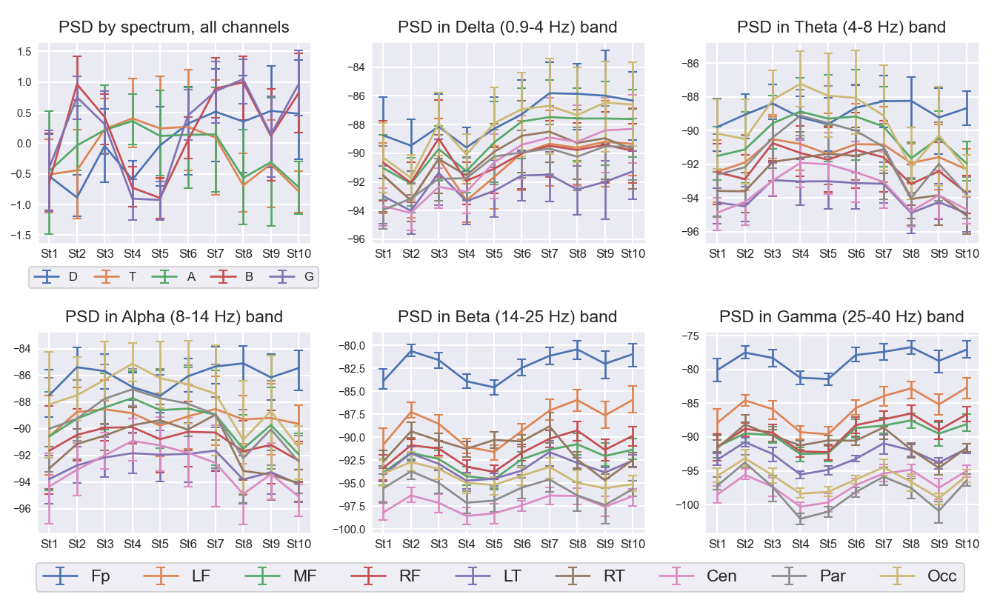

In [23]:
# PSD plot

df_ft_all = df_ft_psd_all_db_sc
df_ft_plt = df_ft_psd_plt_db

#st_bands, st_labels = spr.form_stage_bands(st_edges_result, n_samples)
#n_stages = len(st_bands)

x = [cl for (_, _, cl) in st_bands]
n_cols = ceil((n_freq+1)/2.)
n_rows = 2
fig, axs = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(3*n_cols, 2.7*n_rows))
plt.subplots_adjust(left=0.02)

#pal = plt.get_cmap('rainbow')

# First plot
df_ft_clust = [df_ft_all.iloc[smin:(smax+1), :] for (smin, smax, _) in st_bands]
df_ft_clust_stats = [df_ft_clust[_cl].describe() for _cl in range(n_stages)]
for _freq in range(n_freq):
    y = [df_ft_clust_stats[_cl].loc['mean'][_freq] for _cl in range(n_stages)]
    yerr = np.array([df_ft_clust_stats[_cl].loc[['25%','75%']].to_numpy() 
                     for _cl in range(n_stages)])[:,:,_freq].transpose(1,0)
    yerr[0,:] = y - yerr[0,:]
    yerr[1,:] = yerr[1,:] - y
    #print(yerr)
    axs[0,0].errorbar(x, y, yerr, label=str_freq[_freq], capsize=3, linewidth=1.3)#, color=pal(_freq/(n_freq-1)))
axs[0,0].set_title("PSD by spectrum, all channels", fontsize=11) 
axs[0,0].tick_params(axis='y', labelsize=7, direction='in')#, grid_alpha=0.5)
axs[0,0].tick_params(axis='x', labelsize=8, direction='in')
axs[0,0].legend(loc='lower center', ncol=n_freq, bbox_to_anchor=(-0.05,-0.25,1.1,0.5), fontsize=8, mode='expand')

# All other plots
df_ft_clust = [df_ft_plt.iloc[smin:(smax+1), :] for (smin, smax, _) in st_bands]
df_ft_clust_stats = [df_ft_clust[_cl].describe() for _cl in range(n_stages)]
for _freq in range(n_freq):
    band_columns = [col for col in df_ft_plt.columns if col.startswith(str_freq_rr[_freq])]
    df_ft_cl_stats_band = [df_ft_clust_stats[i][band_columns] for i in range(n_stages)]
    for _reg in range(n_regions_plt):
        y = [df_ft_cl_stats_band[i].loc['mean'][_reg] for i in range(n_stages)]
        yerr = np.array([df_ft_cl_stats_band[i].loc[['25%','75%']].to_numpy() 
                         for i in range(n_stages)])[:,:,_reg].transpose(1,0)
        yerr[0,:] = y - yerr[0,:]
        yerr[1,:] = yerr[1,:] - y
        #print(yerr)
        axs[(_freq+1)//n_cols, (_freq+1)%n_cols].errorbar(x, y, yerr, label=regions_plt[_reg][1], capsize=3, 
                                                          linewidth=1.3)#, color=pal(_reg/(n_regions_plt-1)))
    axs[(_freq+1)//n_cols, (_freq+1)%n_cols].set_title('PSD in ' + bands[_freq][2] + ' band', fontsize=11) 
    axs[(_freq+1)//n_cols, (_freq+1)%n_cols].tick_params(axis='y', labelsize=7, direction='in')#, grid_alpha=0.5)
    axs[(_freq+1)//n_cols, (_freq+1)%n_cols].tick_params(axis='x', labelsize=8, direction='in')

plt.tight_layout(rect=[-0.01,0.05,1,1])

handles, labels = axs[-1,-1].get_legend_handles_labels()
#fig.suptitle('PSD in brain regions by spectrum')
fig.legend(handles, labels, loc='lower center', ncol=n_regions_plt, fontsize=11)#, mode='expand')
plt.savefig(subj_dir_name + ' PSD stat plots.png')


<IPython.core.display.Javascript object>


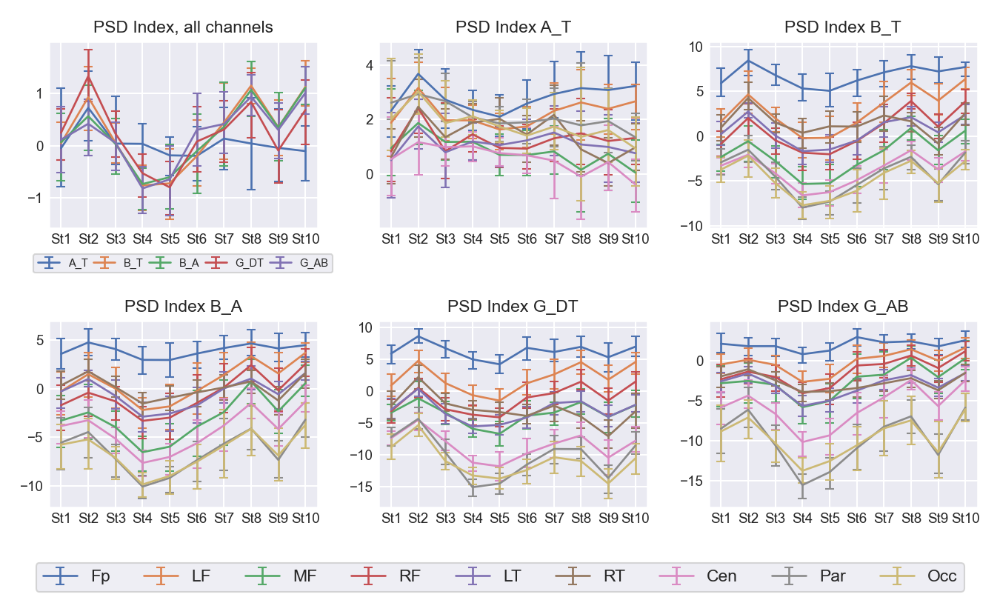

In [24]:
# EEG Indices plots

indices = ['A_T_', 'B_T_', 'B_A_', 'G_DT_', 'G_AB_']
n_indices = len(indices)

df_ft_all = df_ft_psd_ind_all_sc
df_ft_plt = df_ft_psd_ind_plt_log

#st_bands, st_labels = spr.form_stage_bands(st_edges_result, n_samples)
#n_stages = len(st_bands)

x = [cl for (_, _, cl) in st_bands]
n_cols = ceil((n_indices+1)/2.)
n_rows = 2
fig, axs = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(3*n_cols, 2.7*n_rows))
plt.subplots_adjust(left=0.02)

# First plot
ind_cols =[col for col in df_ft_all.columns if any(ind in col for ind in indices) and ('All' in col)]
df_ft_clust = [df_ft_all[ind_cols].iloc[smin:(smax+1), :] for (smin, smax, _) in st_bands]
df_ft_clust_stats = [df_ft_clust[_cl].describe() for _cl in range(n_stages)]
for _ind in range(n_indices):
    y = [df_ft_clust_stats[_cl].loc['mean'][_ind] for _cl in range(n_stages)]
    yerr = np.array([df_ft_clust_stats[_cl].loc[['25%','75%']].to_numpy() for _cl in range(n_stages)])[:,:,_ind].transpose(1,0)
    yerr[0,:] = y - yerr[0,:]
    yerr[1,:] = yerr[1,:] - y
    #print(yerr)
    axs[0,0].errorbar(x, y, yerr, label=indices[_ind][:-1], capsize=3, linewidth=1.3)
axs[0,0].set_title("PSD Index, all channels", fontsize=11) 
axs[0,0].tick_params(axis='both', labelsize=9, direction='in')#, grid_alpha=0.5)
axs[0,0].legend(loc='lower center', ncol=n_indices, bbox_to_anchor=(0.5, -0.27), fontsize=7, columnspacing=0.5)

# All other plots
df_ft_clust = [df_ft_plt.iloc[smin:(smax+1), :] for (smin, smax, _) in st_bands]
df_ft_clust_stats = [df_ft_clust[_cl].describe() for _cl in range(n_stages)]
for _ind in range(n_indices):
    ind_cols = [col for col in df_ft_plt.columns if (indices[_ind] in col)]
    df_ft_cl_stats_ind = [df_ft_clust_stats[_cl][ind_cols] for _cl in range(n_stages)]
    for _reg in range(n_regions_plt):
        y = [df_ft_cl_stats_ind[_cl].loc['mean'][_reg] for _cl in range(n_stages)]
        yerr = np.array([df_ft_cl_stats_ind[_cl].loc[['25%','75%']].to_numpy() 
                         for _cl in range(n_stages)])[:,:,_reg].transpose(1,0)
        yerr[0,:] = y - yerr[0,:]
        yerr[1,:] = yerr[1,:] - y
        #print(yerr)
        axs[(_ind+1)//n_cols, (_ind+1)%n_cols].errorbar(x, y, yerr, label=regions_plt[_reg][1], capsize=3, linewidth=1.3)
    axs[(_ind+1)//n_cols, (_ind+1)%n_cols].set_title('PSD Index ' + indices[_ind][:-1], fontsize=11) 
    axs[(_ind+1)//n_cols, (_ind+1)%n_cols].tick_params(axis='both', labelsize=9, direction='in')#, grid_alpha=0.5)

plt.tight_layout(rect=[0,0.09,1,1])

handles, labels = axs[-1,-1].get_legend_handles_labels()
#fig.suptitle('PSD in brain regions by spectrum')
fig.legend(handles, labels, loc='lower center', ncol=n_regions_plt)#, bbox_to_anchor=(0.5, -0.05))
plt.savefig(subj_dir_name + ' PSD_Ind stat plots.png')


<IPython.core.display.Javascript object>


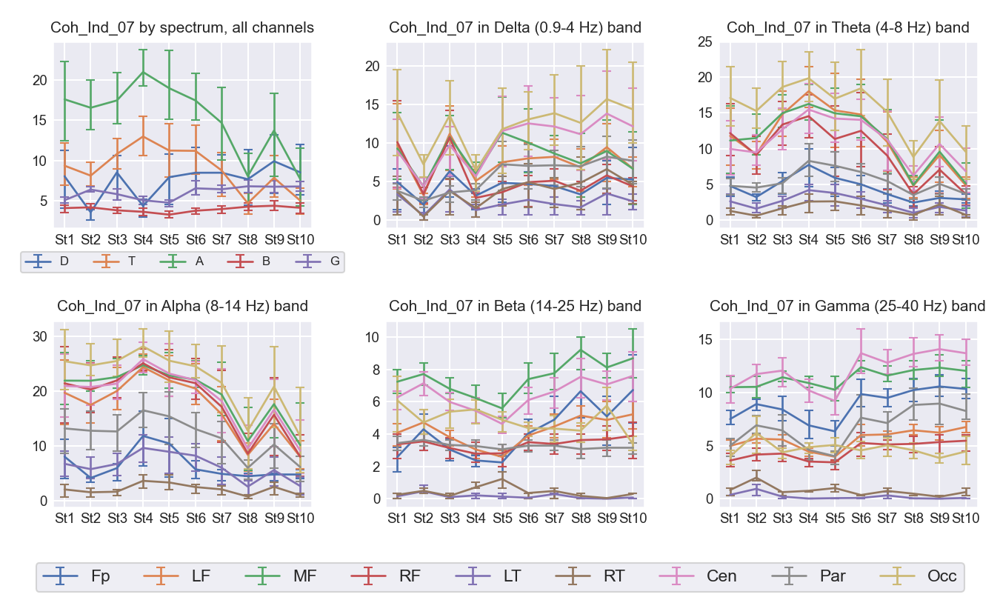

In [25]:
# Coherence indices plot

str_rate = '07'
df_ft_all = df_ft_coh_ind_all
df_ft_plt = df_ft_coh_ind_plt

#st_bands, st_labels = spr.form_stage_bands(st_edges_result, n_samples)
#n_stages = len(st_bands)

x = [cl for (_, _, cl) in st_bands]
n_cols = ceil((n_freq+1)/2.)
n_rows = 2
fig, axs = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(3*n_cols, 2.7*n_rows))
plt.subplots_adjust(left=0.02)

# First plot
rate_cols = [col for col in df_ft_all.columns if (str_rate in col)]
df_ft_clust = [df_ft_all[rate_cols].iloc[smin:(smax+1), :] for (smin, smax, _) in st_bands]
df_ft_clust_stats = [df_ft_clust[_cl].describe() for _cl in range(n_stages)]
for _freq in range(n_freq):
    y = [df_ft_clust_stats[_cl].loc['mean'][_freq] for _cl in range(n_stages)]
    yerr = np.array([df_ft_clust_stats[_cl].loc[['25%','75%']].to_numpy() 
                     for _cl in range(n_stages)])[:,:,_freq].transpose(1,0)
    yerr[0,:] = y - yerr[0,:]
    yerr[1,:] = yerr[1,:] - y
    #print(yerr)
    axs[0,0].errorbar(x, y, yerr, label=str_freq[_freq], capsize=3, linewidth=1.3)
axs[0,0].set_title('Coh_Ind_'+str_rate+' by spectrum, all channels', fontsize=10) 
axs[0,0].tick_params(axis='both', labelsize=9, direction='in')#, grid_alpha=0.5)
axs[0,0].legend(loc='lower center', ncol=n_freq, bbox_to_anchor=(0.5, -0.27), fontsize=8)

# All other plots
rate_cols = [col for col in df_ft_plt.columns if (str_rate in col)]
df_ft_clust = [df_ft_plt[rate_cols].iloc[smin:(smax+1), :] for (smin, smax, _) in st_bands]
df_ft_clust_stats = [df_ft_clust[_cl].describe() for _cl in range(n_stages)]
for _freq in range(n_freq):
    band_columns = [col for col in df_ft_plt[rate_cols].columns if col.startswith(str_freq_rr[_freq])]
    df_ft_cl_stats_band = [df_ft_clust_stats[i][band_columns] for i in range(n_stages)]
    for _reg in range(n_regions_plt):
        y = [df_ft_cl_stats_band[i].loc['mean'][_reg] for i in range(n_stages)]
        yerr = np.array([df_ft_cl_stats_band[i].loc[['25%','75%']].to_numpy() 
                         for i in range(n_stages)])[:,:,_reg].transpose(1,0)
        yerr[0,:] = y - yerr[0,:]
        yerr[1,:] = yerr[1,:] - y
        #print(yerr)
        axs[(_freq+1)//n_cols, (_freq+1)%n_cols].errorbar(x, y, yerr, label=regions_plt[_reg][1], capsize=3, linewidth=1.3)
    axs[(_freq+1)//n_cols, (_freq+1)%n_cols].set_title('Coh_Ind_'+str_rate+' in ' + bands[_freq][2] + ' band', fontsize=10) 
    axs[(_freq+1)//n_cols, (_freq+1)%n_cols].tick_params(axis='both', labelsize=9, direction='in')#, grid_alpha=0.5)

plt.tight_layout(rect=[0,0.09,1,1])

handles, labels = axs[-1,-1].get_legend_handles_labels()
#fig.suptitle('PSD in brain regions by spectrum')
fig.legend(handles, labels, loc='lower center', ncol=n_regions_plt)#, bbox_to_anchor=(0.5, -0.05))
plt.savefig(subj_dir_name + ' Coh_Ind stat plots.png')


<IPython.core.display.Javascript object>


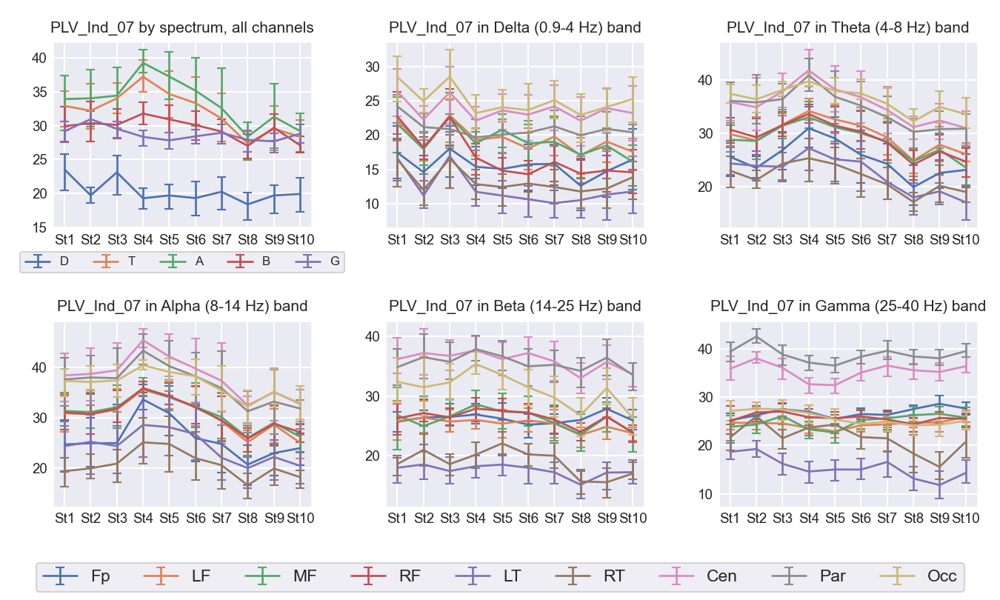

In [26]:
# PLV indices plot

str_rate = '07'
df_ft_all = df_ft_plv_ind_all
df_ft_plt = df_ft_plv_ind_plt

#st_bands, st_labels = spr.form_stage_bands(st_edges_result, n_samples)
#n_stages = len(st_bands)

x = [cl for (_, _, cl) in st_bands]
n_cols = ceil((n_freq+1)/2.)
n_rows = 2
fig, axs = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(3*n_cols, 2.7*n_rows))
plt.subplots_adjust(left=0.02)

# First plot
rate_cols = [col for col in df_ft_all.columns if (str_rate in col)]
df_ft_clust = [df_ft_all[rate_cols].iloc[smin:(smax+1), :] for (smin, smax, _) in st_bands]
df_ft_clust_stats = [df_ft_clust[_cl].describe() for _cl in range(n_stages)]
for _freq in range(n_freq):
    y = [df_ft_clust_stats[_cl].loc['mean'][_freq] for _cl in range(n_stages)]
    yerr = np.array([df_ft_clust_stats[_cl].loc[['25%','75%']].to_numpy() 
                     for _cl in range(n_stages)])[:,:,_freq].transpose(1,0)
    yerr[0,:] = y - yerr[0,:]
    yerr[1,:] = yerr[1,:] - y
    #print(yerr)
    axs[0,0].errorbar(x, y, yerr, label=str_freq[_freq], capsize=3, linewidth=1.3)
axs[0,0].set_title('PLV_Ind_'+str_rate+' by spectrum, all channels', fontsize=10) 
axs[0,0].tick_params(axis='both', labelsize=9, direction='in')#, grid_alpha=0.5)
axs[0,0].legend(loc='lower center', ncol=n_freq, bbox_to_anchor=(0.5, -0.27), fontsize=8)

# All other plots
rate_cols = [col for col in df_ft_plt.columns if (str_rate in col)]
df_ft_clust = [df_ft_plt[rate_cols].iloc[smin:(smax+1), :] for (smin, smax, _) in st_bands]
df_ft_clust_stats = [df_ft_clust[_cl].describe() for _cl in range(n_stages)]
for _freq in range(n_freq):
    band_columns = [col for col in df_ft_plt[rate_cols].columns if col.startswith(str_freq_rr[_freq])]
    df_ft_cl_stats_band = [df_ft_clust_stats[i][band_columns] for i in range(n_stages)]
    for _reg in range(n_regions_plt):
        y = [df_ft_cl_stats_band[i].loc['mean'][_reg] for i in range(n_stages)]
        yerr = np.array([df_ft_cl_stats_band[i].loc[['25%','75%']].to_numpy() 
                         for i in range(n_stages)])[:,:,_reg].transpose(1,0)
        yerr[0,:] = y - yerr[0,:]
        yerr[1,:] = yerr[1,:] - y
        #print(yerr)
        axs[(_freq+1)//n_cols, (_freq+1)%n_cols].errorbar(x, y, yerr, label=regions_plt[_reg][1], capsize=3, linewidth=1.3)
    axs[(_freq+1)//n_cols, (_freq+1)%n_cols].set_title('PLV_Ind_'+str_rate+' in ' + bands[_freq][2] + ' band', fontsize=10) 
    axs[(_freq+1)//n_cols, (_freq+1)%n_cols].tick_params(axis='both', labelsize=9, direction='in')#, grid_alpha=0.5)

plt.tight_layout(rect=[0,0.09,1,1])

handles, labels = axs[-1,-1].get_legend_handles_labels()
#fig.suptitle('PSD in brain regions by spectrum')
fig.legend(handles, labels, loc='lower center', ncol=n_regions_plt)#, bbox_to_anchor=(0.5, -0.05))
plt.savefig(subj_dir_name + ' PLV_Ind stat plots.png')


## Information Value analysis

In [27]:
# Form total dataset (main & surrogate)

df_features = pd.concat([df_ft_psd_loc_db, df_ft_psd_ind_loc_log, df_ft_coh_ind_loc, df_ft_plv_ind_loc,
                           df_ft_coh_loc, df_ft_plv_loc], axis=1)
n_features = len(df_features.columns)
print(n_features)

# Form stage stucture

# Meditator data
st_bands, st_labels = spr.form_stage_bands(st_edges_result)
n_stages = len(st_bands)
print(n_stages, st_bands)


1815 1815
(1180, 1815) (1180, 1815)
10 [(0, 82, 'St1'), (83, 132, 'St2'), (133, 260, 'St3'), (261, 457, 'St4'), (458, 684, 'St5'), (685, 782, 'St6'), (783, 937, 'St7'), (938, 1036, 'St8'), (1037, 1125, 'St9'), (1126, 1179, 'St10')]
10 [(0, 82, 'St1'), (83, 203, 'St2'), (204, 321, 'St3'), (322, 480, 'St4'), (481, 582, 'St5'), (583, 701, 'St6'), (702, 825, 'St7'), (826, 929, 'St8'), (930, 1011, 'St9'), (1012, 1179, 'St10')]


In [28]:
# Dataframe with features IV for all stages (Main data)

n_bins = 6 # number of bins to calculate IV
n_vals_bad = 20

st_names = [nm for (_, _, nm) in st_bands]
df_IV_all = pd.DataFrame(np.nan, index = df_features.columns, columns = st_names)
ds_len_stats_all = []

# Calculate IV
IV_list, WoE_list = ve.IV_WoE_vars_clust(df_features, st_labels, n_bins=n_bins)

for _st in range(n_stages):
    print(st_names[_st])
    
    # Print target epochs %
    ds_len_tar = st_bands[_st][1] - st_bands[_st][0] + 1
    ds_len_tot = n_samples
    print(ds_len_tot, ds_len_tar, round(ds_len_tar/ds_len_tot*100, 2))
    ds_len_stats_all.append([ds_len_tar, ds_len_tar/ds_len_tot])
    
    # DataFrame with IV for all stages
    df_IV = IV_list[_st]
    
    # Correct IV of degenerate features to zero
    for ft in df_features_surr.columns:
        n_val = len(np.unique(df_features_surr[ft].to_numpy()))
        if n_val <= n_vals_bad:
            df_IV['IV'].loc[df_IV['Variable']==ft] = 0
    
    # Fill DataFrame   
    for _var in range(n_features):
        var_name = df_IV['Variable'].iloc[_var]
        var_IV = df_IV['IV'].iloc[_var]
        #print(var_name, var_IV)
        df_IV_all.loc[var_name, st_names[_st]] = var_IV
    print()

display(df_IV_all.head(100))
df_IV_all.to_excel(subj_dir_name + ' df_IV_all.xlsx')

N_bins =  6
N_bins =  6
N_bins =  6
N_bins =  6
N_bins =  6
N_bins =  6
N_bins =  6
N_bins =  6
N_bins =  6
N_bins =  6
St1
1180 83 7.03

St2
1180 50 4.24

St3
1180 128 10.85

St4
1180 197 16.69

St5
1180 227 19.24

St6
1180 98 8.31

St7
1180 155 13.14

St8
1180 99 8.39

St9
1180 89 7.54

St10
1180 54 4.58



,St1,St2,St3,St4,St5,St6,St7,St8,St9,St10
D_psd_Fp,0.16,0.33,0.03,0.65,0.07,0.03,0.28,0.35,0.29,0.17
D_psd_LF,0.12,0.73,0.08,0.94,0.11,0.12,0.33,0.25,0.27,0.53
D_psd_MF,0.34,0.98,0.13,0.64,0.02,0.20,0.32,0.23,0.17,0.37
D_psd_RF,0.14,0.36,0.25,0.53,0.11,0.12,0.16,0.11,0.16,0.05
D_psd_LT,0.09,0.49,0.18,0.25,0.03,0.21,0.19,0.02,0.04,0.23
...,...,...,...,...,...,...,...,...,...,...
B_D_psd_LF,0.26,2.00,0.03,0.24,0.58,0.10,0.05,0.38,0.05,0.23
B_T_psd_LF,0.33,0.76,0.49,1.03,0.88,0.12,0.35,2.53,0.81,2.30
B_A_psd_LF,0.07,0.43,0.11,1.02,0.53,0.09,0.45,1.74,0.65,1.97
B_DT_psd_LF,0.12,1.88,0.13,0.45,0.95,0.18,0.14,1.30,0.16,0.92


In [29]:
# Aggregated DataFrame (Main data)

head_names = ['N_stage_epochs', '%_stage_epochs']
len_head = len(head_names)
ft_type_names = ['PSD', 'PSD_Ind', 'Coh', 'PLV', 'Coh_Ind', 'PLV_Ind']

IV_thr_const = 0.4 # IV threshold for statistics calculations in bands
ind_suffix = '%_IV_'+str(IV_thr_const)

col_names = list(df_IV_all.columns)
ind_names = (head_names + ['Avg_IV_All', ind_suffix+'_All'] + [ind_suffix+'_'+reg for (_,reg,_,_) in regions_plt] + 
             [ind_suffix+'_'+fr for fr in str_freq] + [ind_suffix+'_'+ft for ft in ft_type_names])
len_thresh = 2
df_IV_stats = pd.DataFrame(0, index=col_names, columns=ind_names)

for _st in range(n_stages):
    col = col_names[_st]
    
    # Head - number and % of epoches in dataset groups
    for _h in range(len_head):
        df_IV_stats[head_names[_h]].iloc[_st] = ds_len_stats_all[_st][_h]

    # Overall statistics
    df_IV_stats['Avg_IV_All'].iloc[_st] = df_IV_all[col].mean()
    df_IV_stats[ind_suffix+'_All'].iloc[_st] = len(df_IV_all[df_IV_all[col]>=IV_thr_const]) / n_features
       
    # By regions    
    for _reg in range(n_regions_plt):
        ind_reg = [ft for ft in df_IV_all.index if any(r in ft for r in regions_plt[_reg][3])]
        ind_stats = len_head+len_thresh+_reg
        df_IV_stats[ind_names[ind_stats]].iloc[_st] = (len(df_IV_all.loc[ind_reg][df_IV_all[col]>=IV_thr_const]) / len(ind_reg))        
    # By frequency bands
    for _freq in range(len(str_freq)):
        ind_freq = [ft for ft in df_IV_all.index if ft.startswith(str_freq[_freq])]
        ind_stats = len_head+len_thresh+n_regions_plt+_freq
        df_IV_stats[ind_names[ind_stats]].iloc[_st] = (len(df_IV_all.loc[ind_freq][df_IV_all[col]>=IV_thr_const]) / len(ind_freq))        
    # By feature types
    for _ft in range(len(ft_type_names)):
        ind_stats = len_head+len_thresh+n_regions_plt+len(str_freq)+_ft
        
        if ft_type_names[_ft] == 'PSD':
            ind_ft = list(df_ft_psd_loc_db.columns)
        elif ft_type_names[_ft] == 'PSD_Ind':
            ind_ft = list(df_ft_psd_ind_loc_log.columns)
        elif ft_type_names[_ft] == 'Coh':
            ind_ft = list(df_ft_coh_loc.columns)
        elif ft_type_names[_ft] == 'PLV':
            ind_ft = list(df_ft_plv_loc.columns)
        elif ft_type_names[_ft] == 'Coh_Ind':
            ind_ft = list(df_ft_coh_ind_loc.columns)
        elif ft_type_names[_ft] == 'PLV_Ind':
            ind_ft = list(df_ft_plv_ind_loc.columns)
            
        df_IV_stats[ind_names[ind_stats]].iloc[_st] = (len(df_IV_all.loc[ind_ft][df_IV_all[col]>=IV_thr_const]) / len(ind_ft))
        
with pd.ExcelWriter(subj_dir_name+' df_IV_all.xlsx') as writer:
    df_IV_all.to_excel(writer, sheet_name='IV_all')
    df_IV_stats.to_excel(writer, sheet_name='IV_stats')
display(df_IV_stats)


,N_stage_epochs,%_stage_epochs,Avg_IV_All,%_IV_0.4_All,%_IV_0.4_Fp,%_IV_0.4_LF,%_IV_0.4_MF,%_IV_0.4_RF,%_IV_0.4_LT,%_IV_0.4_RT,...,%_IV_0.4_T,%_IV_0.4_A,%_IV_0.4_B,%_IV_0.4_G,%_IV_0.4_PSD,%_IV_0.4_PSD_Ind,%_IV_0.4_Coh,%_IV_0.4_PLV,%_IV_0.4_Coh_Ind,%_IV_0.4_PLV_Ind
St1,83,0.07,0.40,0.33,0.19,0.26,0.23,0.30,0.17,0.32,...,0.32,0.17,0.34,0.41,0.43,0.40,0.38,0.26,0.28,0.33
St2,50,0.04,0.74,0.61,0.71,0.59,0.53,0.52,0.46,0.69,...,0.57,0.43,0.65,0.69,0.68,0.79,0.65,0.49,0.73,0.46
St3,128,0.11,0.28,0.21,0.14,0.30,0.20,0.29,0.10,0.15,...,0.27,0.09,0.14,0.23,0.31,0.18,0.25,0.14,0.32,0.21
St4,197,0.17,0.60,0.52,0.50,0.50,0.51,0.44,0.32,0.37,...,0.59,0.66,0.44,0.52,0.59,0.75,0.51,0.32,0.73,0.53
St5,227,0.19,0.37,0.29,0.41,0.33,0.25,0.28,0.18,0.30,...,0.13,0.17,0.39,0.53,0.35,0.50,0.33,0.16,0.33,0.18
St6,98,0.08,0.23,0.13,0.23,0.16,0.12,0.17,0.07,0.09,...,0.05,0.08,0.11,0.32,0.25,0.04,0.21,0.11,0.18,0.03
St7,155,0.13,0.25,0.17,0.25,0.15,0.07,0.14,0.13,0.09,...,0.05,0.06,0.24,0.33,0.39,0.24,0.20,0.09,0.22,0.06
St8,99,0.08,0.75,0.53,0.53,0.55,0.56,0.52,0.38,0.43,...,0.72,0.74,0.55,0.50,0.61,0.71,0.54,0.36,0.59,0.66
St9,89,0.08,0.39,0.31,0.43,0.31,0.27,0.20,0.26,0.32,...,0.34,0.21,0.26,0.47,0.25,0.29,0.37,0.20,0.40,0.38
St10,54,0.05,0.76,0.60,0.54,0.61,0.56,0.61,0.45,0.50,...,0.72,0.75,0.66,0.55,0.73,0.73,0.63,0.44,0.65,0.63


## Information value plots

N_bins =  6
N_bins =  6
N_bins =  6
N_bins =  6
N_bins =  6
N_bins =  6
N_bins =  6
N_bins =  6
N_bins =  6
N_bins =  6


<IPython.core.display.Javascript object>


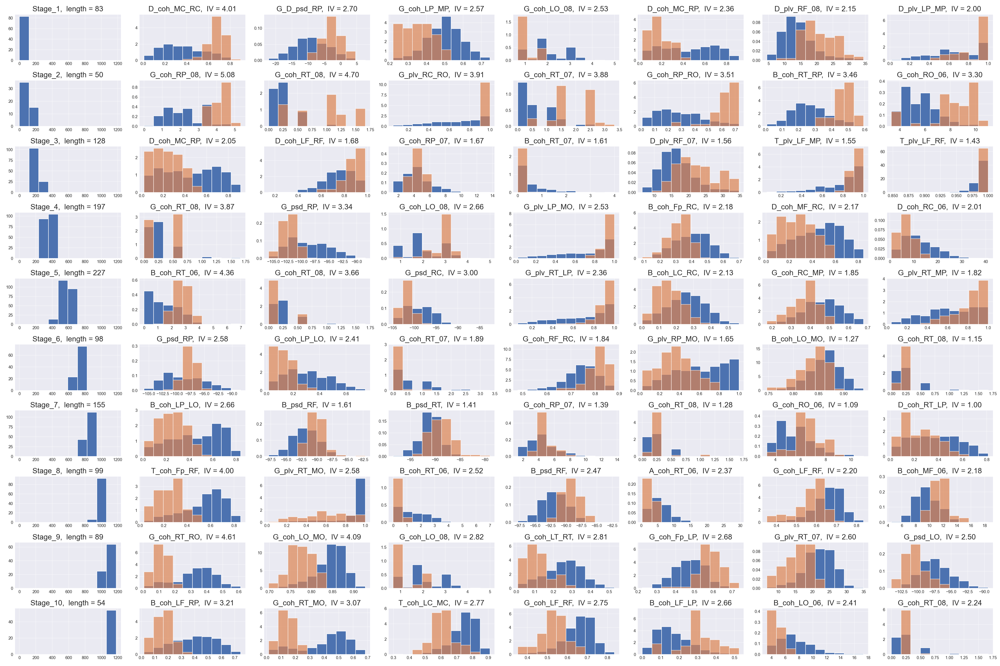

(<Figure size 3000x2000 with 80 Axes>,
 array([[<AxesSubplot:title={'center':'Stage_1,  length = 83'}>,
         <AxesSubplot:title={'center':'D_coh_MC_RC,  IV = 4.01'}>,
         <AxesSubplot:title={'center':'G_D_psd_RP,  IV = 2.70'}>,
         <AxesSubplot:title={'center':'G_coh_LP_MP,  IV = 2.57'}>,
         <AxesSubplot:title={'center':'G_coh_LO_08,  IV = 2.53'}>,
         <AxesSubplot:title={'center':'D_coh_MC_RP,  IV = 2.36'}>,
         <AxesSubplot:title={'center':'D_plv_RF_08,  IV = 2.15'}>,
         <AxesSubplot:title={'center':'D_plv_LP_MP,  IV = 2.00'}>],
        [<AxesSubplot:title={'center':'Stage_2,  length = 50'}>,
         <AxesSubplot:title={'center':'G_coh_RP_08,  IV = 5.08'}>,
         <AxesSubplot:title={'center':'G_coh_RT_08,  IV = 4.70'}>,
         <AxesSubplot:title={'center':'G_plv_RC_RO,  IV = 3.91'}>,
         <AxesSubplot:title={'center':'G_coh_RT_07,  IV = 3.88'}>,
         <AxesSubplot:title={'center':'G_coh_RP_RO,  IV = 3.51'}>,
         <AxesSubplot:title

In [32]:
# Plotting overall best IV features

N_BEST_FEATURES = 7
df_ft_IV = df_features

#st_bands, st_labels = spr.form_stage_bands(st_edges_result)
            
best_IV_list, best_WoE_list = ve.best_IV_WoE_vars_clust(df_ft_IV, st_labels, n_bins=n_bins, n_best_vars=N_BEST_FEATURES, 
                                                        corr_threshold=0.5, IV_threshold=0.2)
ve.plot_hist_best_vars(df_ft_IV, st_labels, best_IV_list, title_prefix=subj_dir_name+' overall', stages=True)    
       

N_bins =  6
N_bins =  6
N_bins =  6
N_bins =  6
N_bins =  6
N_bins =  6
N_bins =  6
N_bins =  6
N_bins =  6
N_bins =  6


<IPython.core.display.Javascript object>


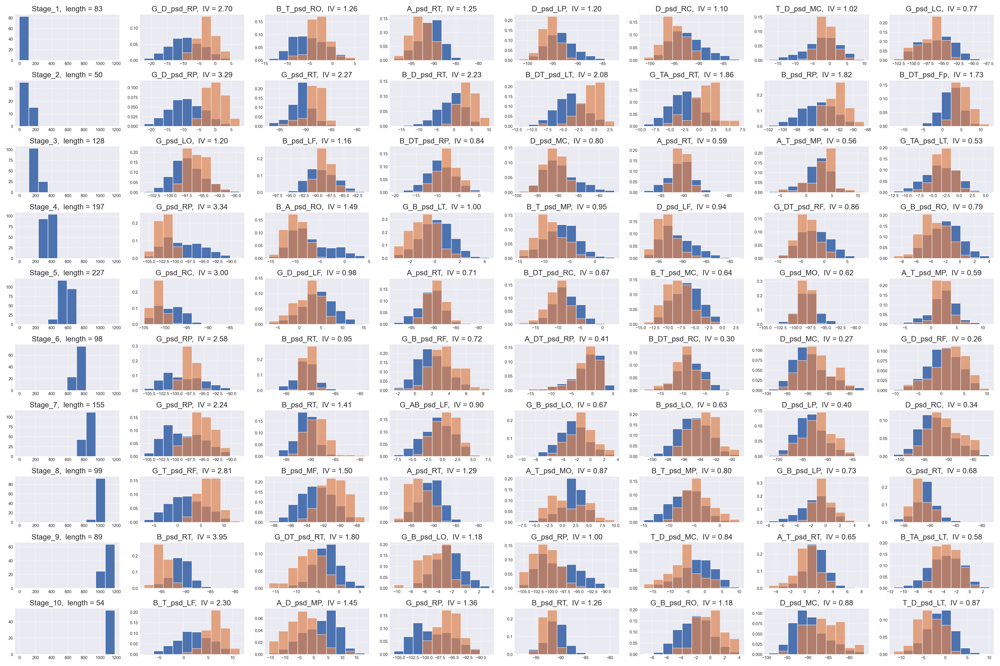

(<Figure size 3000x2000 with 80 Axes>,
 array([[<AxesSubplot:title={'center':'Stage_1,  length = 83'}>,
         <AxesSubplot:title={'center':'G_D_psd_RP,  IV = 2.70'}>,
         <AxesSubplot:title={'center':'B_T_psd_RO,  IV = 1.26'}>,
         <AxesSubplot:title={'center':'A_psd_RT,  IV = 1.25'}>,
         <AxesSubplot:title={'center':'D_psd_LP,  IV = 1.20'}>,
         <AxesSubplot:title={'center':'D_psd_RC,  IV = 1.10'}>,
         <AxesSubplot:title={'center':'T_D_psd_MC,  IV = 1.02'}>,
         <AxesSubplot:title={'center':'G_psd_LC,  IV = 0.77'}>],
        [<AxesSubplot:title={'center':'Stage_2,  length = 50'}>,
         <AxesSubplot:title={'center':'G_D_psd_RP,  IV = 3.29'}>,
         <AxesSubplot:title={'center':'G_psd_RT,  IV = 2.27'}>,
         <AxesSubplot:title={'center':'B_D_psd_RT,  IV = 2.23'}>,
         <AxesSubplot:title={'center':'B_DT_psd_LT,  IV = 2.08'}>,
         <AxesSubplot:title={'center':'G_TA_psd_RT,  IV = 1.86'}>,
         <AxesSubplot:title={'center':'B_psd_R

In [33]:
# Plotting PSD + PSD_Ind best IV features

N_BEST_FEATURES = 7

df_ft_IV = pd.concat([df_ft_psd_loc_db, df_ft_psd_ind_loc_log], axis=1)

best_IV_list, best_WoE_list = ve.best_IV_WoE_vars_clust(df_ft_IV, st_labels, n_bins=n_bins, n_best_vars=N_BEST_FEATURES, 
                                                        corr_threshold=0.5, IV_threshold=0.2)

ve.plot_hist_best_vars(df_ft_IV, st_labels, best_IV_list, title_prefix=subj_dir_name+' PSD', stages=True)

N_bins =  6
N_bins =  6
N_bins =  6
N_bins =  6
N_bins =  6
N_bins =  6
N_bins =  6
N_bins =  6
N_bins =  6
N_bins =  6


<IPython.core.display.Javascript object>


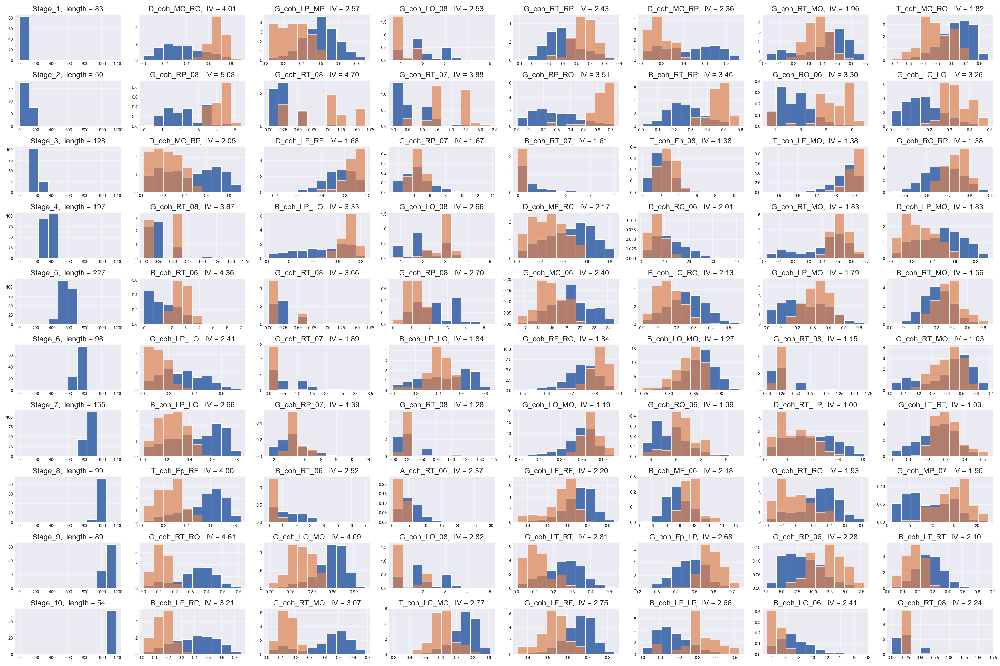

(<Figure size 3000x2000 with 80 Axes>,
 array([[<AxesSubplot:title={'center':'Stage_1,  length = 83'}>,
         <AxesSubplot:title={'center':'D_coh_MC_RC,  IV = 4.01'}>,
         <AxesSubplot:title={'center':'G_coh_LP_MP,  IV = 2.57'}>,
         <AxesSubplot:title={'center':'G_coh_LO_08,  IV = 2.53'}>,
         <AxesSubplot:title={'center':'G_coh_RT_RP,  IV = 2.43'}>,
         <AxesSubplot:title={'center':'D_coh_MC_RP,  IV = 2.36'}>,
         <AxesSubplot:title={'center':'G_coh_RT_MO,  IV = 1.96'}>,
         <AxesSubplot:title={'center':'T_coh_MC_RO,  IV = 1.82'}>],
        [<AxesSubplot:title={'center':'Stage_2,  length = 50'}>,
         <AxesSubplot:title={'center':'G_coh_RP_08,  IV = 5.08'}>,
         <AxesSubplot:title={'center':'G_coh_RT_08,  IV = 4.70'}>,
         <AxesSubplot:title={'center':'G_coh_RT_07,  IV = 3.88'}>,
         <AxesSubplot:title={'center':'G_coh_RP_RO,  IV = 3.51'}>,
         <AxesSubplot:title={'center':'B_coh_RT_RP,  IV = 3.46'}>,
         <AxesSubplot:titl

In [34]:
# Plotting Coh + Coh_Ind best IV features

N_BEST_FEATURES = 7

df_ft_IV = pd.concat([df_ft_coh_loc, df_ft_coh_ind_loc], axis=1)

best_IV_list, best_WoE_list = ve.best_IV_WoE_vars_clust(df_ft_IV, st_labels, n_bins=n_bins, n_best_vars=N_BEST_FEATURES, 
                                                        corr_threshold=0.5, IV_threshold=0.2)

ve.plot_hist_best_vars(df_ft_IV, st_labels, best_IV_list, title_prefix=subj_dir_name+' Coherence', stages=True)

N_bins =  6
N_bins =  6
N_bins =  6
N_bins =  6
N_bins =  6
N_bins =  6
N_bins =  6
N_bins =  6
N_bins =  6
N_bins =  6


<IPython.core.display.Javascript object>


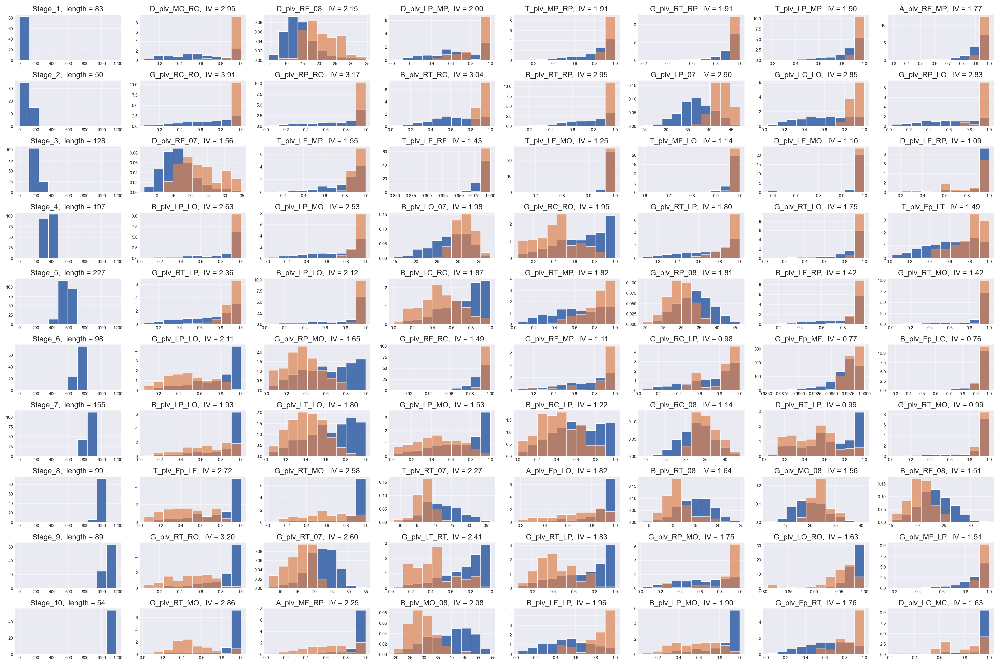

(<Figure size 3000x2000 with 80 Axes>,
 array([[<AxesSubplot:title={'center':'Stage_1,  length = 83'}>,
         <AxesSubplot:title={'center':'D_plv_MC_RC,  IV = 2.95'}>,
         <AxesSubplot:title={'center':'D_plv_RF_08,  IV = 2.15'}>,
         <AxesSubplot:title={'center':'D_plv_LP_MP,  IV = 2.00'}>,
         <AxesSubplot:title={'center':'T_plv_MP_RP,  IV = 1.91'}>,
         <AxesSubplot:title={'center':'G_plv_RT_RP,  IV = 1.91'}>,
         <AxesSubplot:title={'center':'T_plv_LP_MP,  IV = 1.90'}>,
         <AxesSubplot:title={'center':'A_plv_RF_MP,  IV = 1.77'}>],
        [<AxesSubplot:title={'center':'Stage_2,  length = 50'}>,
         <AxesSubplot:title={'center':'G_plv_RC_RO,  IV = 3.91'}>,
         <AxesSubplot:title={'center':'G_plv_RP_RO,  IV = 3.17'}>,
         <AxesSubplot:title={'center':'B_plv_RT_RC,  IV = 3.04'}>,
         <AxesSubplot:title={'center':'B_plv_RT_RP,  IV = 2.95'}>,
         <AxesSubplot:title={'center':'G_plv_LP_07,  IV = 2.90'}>,
         <AxesSubplot:titl

In [35]:
# Plotting PLV + PLV_Ind best IV features

N_BEST_FEATURES = 7

df_ft_IV = pd.concat([df_ft_plv_loc, df_ft_plv_ind_loc], axis=1)

best_IV_list, best_WoE_list = ve.best_IV_WoE_vars_clust(df_ft_IV, st_labels, n_bins=n_bins, n_best_vars=N_BEST_FEATURES, 
                                                        corr_threshold=0.5, IV_threshold=0.2)

ve.plot_hist_best_vars(df_ft_IV, st_labels, best_IV_list, title_prefix=subj_dir_name+' PLV', stages=True)